In [1]:
import pandas as pd
import numpy as np

import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
import plotly
import chart_studio.plotly as py
import plotly.express as px
import cufflinks as cf
cf.go_offline()

import os
import tqdm
import requests
from datetime import datetime, timedelta
import time

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn import preprocessing

import lightgbm as lgb

In [2]:
path_data = r'C:\Users\user\siemens_hack_2022\0_data'

path_data_London = os.path.join(path_data, 'London_drive')

In [3]:
os.listdir(path_data_London)

['london_std.pkl_gz', 'london_tou.pkl_gz', 'london_weather.csv']

In [4]:
all_trends_GB = pd.read_csv(os.path.join(path_data, 'all_trends_GB.csv'))
all_trends_GB = all_trends_GB.pivot_table(index='date',columns='title',values='value')
all_trends_GB.index = pd.to_datetime(all_trends_GB.index)

In [5]:
london_weather = pd.read_csv(os.path.join(path_data_London, 'london_weather.csv'), index_col='time',parse_dates=True)

In [6]:
london_tou = pd.read_pickle(os.path.join(path_data_London, 'london_tou.pkl_gz'),compression='gzip')
london_std = pd.read_pickle(os.path.join(path_data_London, 'london_std.pkl_gz'),compression='gzip')

In [7]:
df_holiday = []

for year in np.arange(2011, 2015+1):
    holiday_temp = pd.read_html('https://www.timeanddate.com/holidays/uk/'+str(year))[0]
    holiday_temp.columns = holiday_temp.columns.get_level_values(0)
    holiday_temp = holiday_temp[~holiday_temp['Date'].str.contains('Observed').fillna(False)]
    holiday_temp = holiday_temp.dropna(how='all')
    holiday_temp = holiday_temp[['Date', 'Name', 'Type']]
    holiday_temp['Date'] = str(year) + ' ' + holiday_temp['Date']
    holiday_temp['Date'] = pd.to_datetime(holiday_temp['Date'])
    
    df_holiday.append(holiday_temp)
    
df_holiday = pd.concat(df_holiday, axis=0, ignore_index=True)

df_holiday = df_holiday.drop_duplicates(subset=['Date'])
df_holiday = df_holiday.set_index('Date').asfreq('D')
df_holiday.loc[df_holiday.index.weekday>=5, 'Name'] = 'weekend'
df_holiday.loc[df_holiday.index.weekday>=5, 'Type'] = 'weekend'
df_holiday['Name'] = df_holiday['Name'].fillna('weekday')
df_holiday['Type'] = df_holiday['Type'].fillna('weekday')
df_holiday.columns = 'holiday_' + df_holiday.columns

df_holiday = df_holiday.reset_index()
df_holiday = df_holiday.rename(columns={'Date':'date'}) 

In [8]:
df_holiday_encode = df_holiday.copy()
df_holiday_encode[['holiday_Name', 'holiday_Type']] = df_holiday_encode[['holiday_Name', 'holiday_Type']].astype('str').apply(preprocessing.LabelEncoder().fit_transform)
df_holiday_encode.columns = df_holiday_encode.columns+'_encode'
df_holiday_encode = df_holiday_encode.rename(columns={'date_encode':'date'})

### TOU

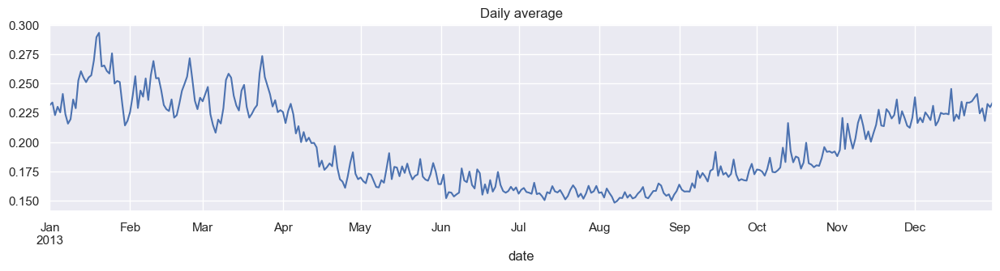

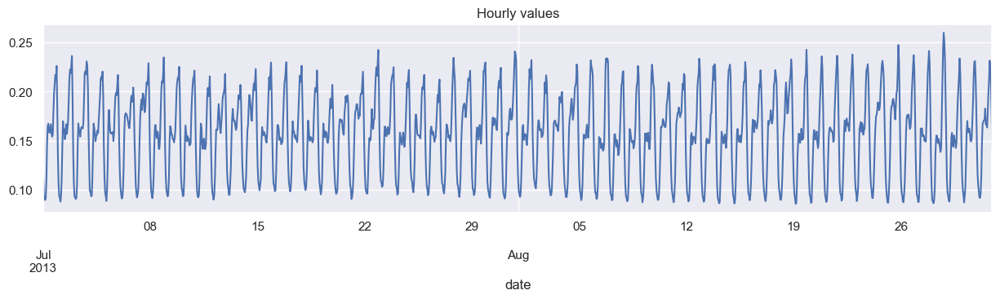

In [9]:
london_tou.mean(axis=1).rename('load').loc['2013'].resample('D').mean().plot(title='Daily average', figsize=(15,3))
plt.show()
london_tou.mean(axis=1).rename('load').loc['2013-07':'2013-08'].plot(title='Hourly values', figsize=(15,3))
plt.show()

In [10]:
df_dataset = london_tou.mean(axis=1).rename('load').to_frame().copy()


index_temp = df_dataset.index.copy()

df_dataset['date'] = pd.to_datetime(df_dataset.index.date)
df_dataset['year'] = df_dataset.index.year.astype('int')
df_dataset['weekday'] = df_dataset.index.weekday
df_dataset['hour'] = df_dataset.index.hour + df_dataset.index.minute/60
df_dataset['timeofweek'] = df_dataset['hour'] + df_dataset['weekday']*24

df_dataset['load_shift24'] = df_dataset['load'].shift(24)
df_dataset['load_shift168'] = df_dataset['load'].shift(168)

df_dataset = df_dataset.merge(london_weather['temp'], left_index=True, right_index=True)
df_dataset['temp_roll24_mean'] = df_dataset['temp'].rolling(24).mean()

df_dataset = df_dataset.merge(df_holiday, on='date')
df_dataset = df_dataset.merge(df_holiday_encode, on='date')
df_dataset = df_dataset.merge(all_trends_GB.reset_index(), on='date')

#df_dataset = df_dataset.drop('date',axis=1)
df_dataset.index = index_temp


df_dataset

,load,date,year,weekday,hour,timeofweek,load_shift24,load_shift168,temp,temp_roll24_mean,...,Teacher,The ODP Corporation,The Office,United States Postal Service,User Account,Windows 10,Writing,Xfinity,macOS,new
date,,,,,,,,,,,,,,,,,,,,,
2011-11-23 09:00:00,0.180500,2011-11-23,2011,2,9.0,57.0,NaN,NaN,5.0,NaN,...,1.146530,0.353131,0.193725,1.094773,0.481665,-0.757388,2.055765,1.016356,0.249196,0.133189
2011-11-23 10:00:00,0.088750,2011-11-23,2011,2,10.0,58.0,NaN,NaN,5.0,NaN,...,1.146530,0.353131,0.193725,1.094773,0.481665,-0.757388,2.055765,1.016356,0.249196,0.133189
2011-11-23 11:00:00,0.101250,2011-11-23,2011,2,11.0,59.0,NaN,NaN,7.0,NaN,...,1.146530,0.353131,0.193725,1.094773,0.481665,-0.757388,2.055765,1.016356,0.249196,0.133189
2011-11-23 12:00:00,0.162500,2011-11-23,2011,2,12.0,60.0,NaN,NaN,8.0,NaN,...,1.146530,0.353131,0.193725,1.094773,0.481665,-0.757388,2.055765,1.016356,0.249196,0.133189
2011-11-23 13:00:00,0.149750,2011-11-23,2011,2,13.0,61.0,NaN,NaN,9.0,NaN,...,1.146530,0.353131,0.193725,1.094773,0.481665,-0.757388,2.055765,1.016356,0.249196,0.133189
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-02-27 20:00:00,0.328569,2014-02-27,2014,3,20.0,92.0,0.339567,0.319700,8.0,8.583333,...,0.815551,-0.093934,-0.888428,0.247372,-0.546552,-0.219312,1.302608,-1.616201,0.333619,0.890518
2014-02-27 21:00:00,0.315401,2014-02-27,2014,3,21.0,93.0,0.307765,0.293022,6.0,8.500000,...,0.815551,-0.093934,-0.888428,0.247372,-0.546552,-0.219312,1.302608,-1.616201,0.333619,0.890518
2014-02-27 22:00:00,0.287290,2014-02-27,2014,3,22.0,94.0,0.274702,0.269723,6.0,8.458333,...,0.815551,-0.093934,-0.888428,0.247372,-0.546552,-0.219312,1.302608,-1.616201,0.333619,0.890518


## 1st model: temporal feature + weather feature

C:\Users\user\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1114: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



<AxesSubplot: xlabel='timeofweek', ylabel='load'>

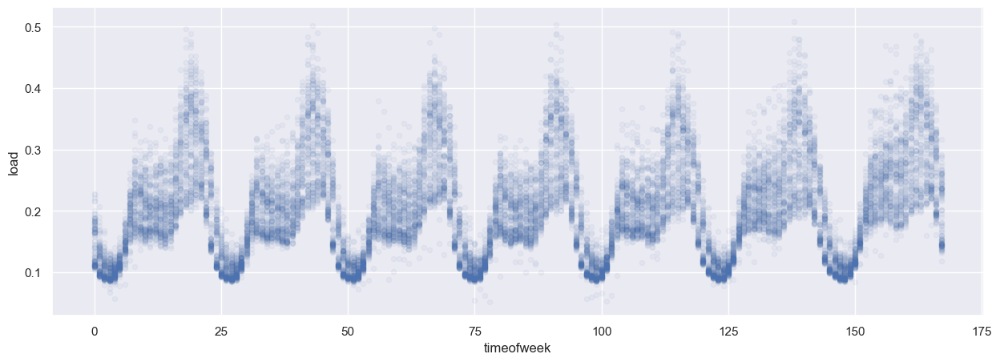

In [11]:
df_dataset.plot(kind='scatter',x='timeofweek',y='load', figsize=(15,5),alpha=0.05)

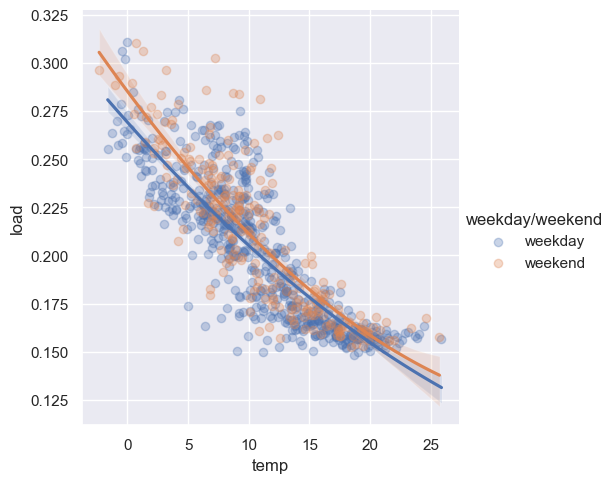

In [12]:
# Scatter plot for demand and outdoor temperature
df_plot = df_dataset.resample('D').mean().copy()
df_plot['weekday/weekend'] = 'weekday'
df_plot.loc[df_plot['weekday']>4, 'weekday/weekend'] ='weekend'

sns.lmplot(x='temp', y='load', hue="weekday/weekend",
           data=df_plot, order=2, scatter_kws={'alpha':0.3})

In [13]:
list_feat = ['weekday','hour','temp', 'temp_roll24_mean']

Model: LGBM
R SQUARED: 0.8657
MAE: 0.019


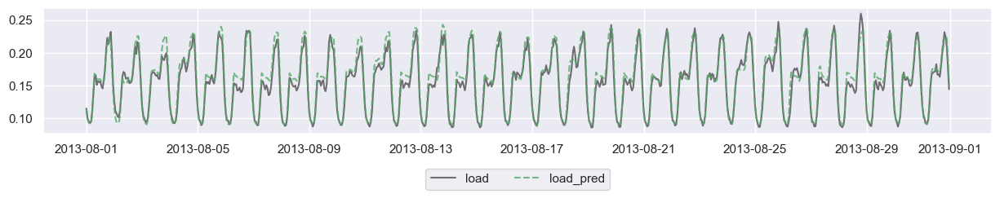

In [14]:
traindata = df_dataset.loc[:'2012'].copy()
testdata = df_dataset.loc['2013':].copy()

LGB_model = lgb.LGBMRegressor()
LGB_model.fit(traindata[list_feat], traindata['load'])
testdata['load_pred'] = LGB_model.predict(testdata[list_feat])
errors = abs(testdata['load_pred'] - testdata['load'])
RSQUARED = r2_score(testdata['load'], testdata['load_pred'])
MAE = mean_absolute_error(testdata['load'], testdata['load_pred'])

print("Model: LGBM")
print("R SQUARED: "+str(round(RSQUARED,4)))
print("MAE: "+str(round(MAE,4)))

plt.figure(figsize=(15,2))
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load'], '-k', alpha=0.6, label='load')
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load_pred'], '--g', alpha=0.8, label='load_pred')
plt.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.5))

In [15]:
testdata[['load','load_pred']].iplot()
(testdata['load_pred'] - testdata['load']).resample('D').mean().iplot(kind='bar')

## 2nd model: add calendar data

In [16]:
list_feat = ['weekday','hour','temp', 'temp_roll24_mean',
             'holiday_Name_encode','holiday_Type_encode']

Model: LGBM
R SQUARED: 0.8677
MAE: 0.0189


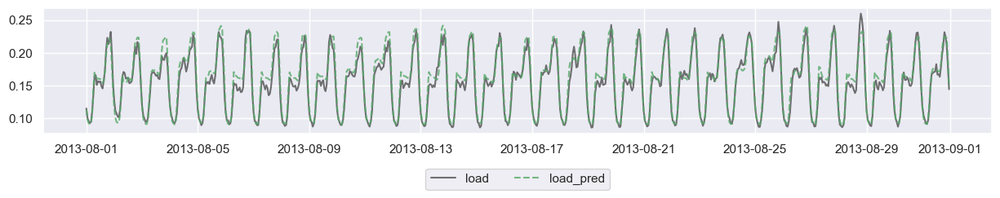

In [17]:
traindata = df_dataset.loc[:'2012'].copy()
testdata = df_dataset.loc['2013':].copy()

LGB_model = lgb.LGBMRegressor()
LGB_model.fit(traindata[list_feat], traindata['load'])
testdata['load_pred'] = LGB_model.predict(testdata[list_feat])
errors = abs(testdata['load_pred'] - testdata['load'])
RSQUARED = r2_score(testdata['load'], testdata['load_pred'])
MAE = mean_absolute_error(testdata['load'], testdata['load_pred'])

print("Model: LGBM")
print("R SQUARED: "+str(round(RSQUARED,4)))
print("MAE: "+str(round(MAE,4)))

plt.figure(figsize=(15,2))
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load'], '-k', alpha=0.6, label='load')
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load_pred'], '--g', alpha=0.8, label='load_pred')
plt.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.5))

In [18]:
testdata[['load','load_pred']].iplot()
(testdata['load_pred'] - testdata['load']).resample('D').mean().iplot(kind='bar')

## 3rd model: add lag features

In [19]:
list_feat = ['weekday','hour','temp', 'temp_roll24_mean',
             'holiday_Name_encode','holiday_Type_encode',
             'load_shift24', 'load_shift168']

Model: LGBM
R SQUARED: 0.953
MAE: 0.0111


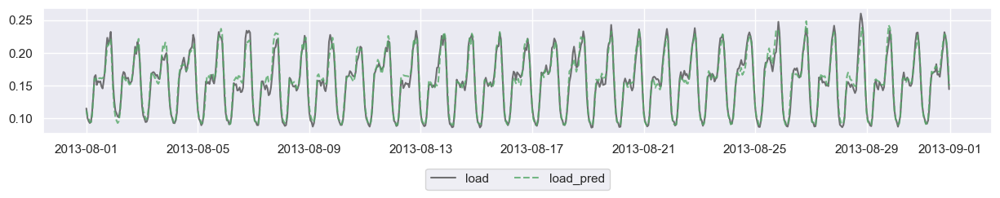

In [20]:
traindata = df_dataset.loc[:'2012'].copy()
testdata = df_dataset.loc['2013':].copy()

LGB_model = lgb.LGBMRegressor()
LGB_model.fit(traindata[list_feat], traindata['load'])
testdata['load_pred'] = LGB_model.predict(testdata[list_feat])
errors = abs(testdata['load_pred'] - testdata['load'])
RSQUARED = r2_score(testdata['load'], testdata['load_pred'])
MAE = mean_absolute_error(testdata['load'], testdata['load_pred'])

print("Model: LGBM")
print("R SQUARED: "+str(round(RSQUARED,4)))
print("MAE: "+str(round(MAE,4)))

plt.figure(figsize=(15,2))
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load'], '-k', alpha=0.6, label='load')
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load_pred'], '--g', alpha=0.8, label='load_pred')
plt.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.5))

In [21]:
testdata[['load','load_pred']].iplot()
(testdata['load_pred'] - testdata['load']).resample('D').mean().iplot(kind='bar')

## 4rd model: add google trends data

In [22]:
df_plot = df_dataset.resample('D').mean()
df_plot = (df_plot-df_plot.mean())/df_plot.std()
df_plot[['load','Microsoft Excel', 'Education', 'temp']].iplot()

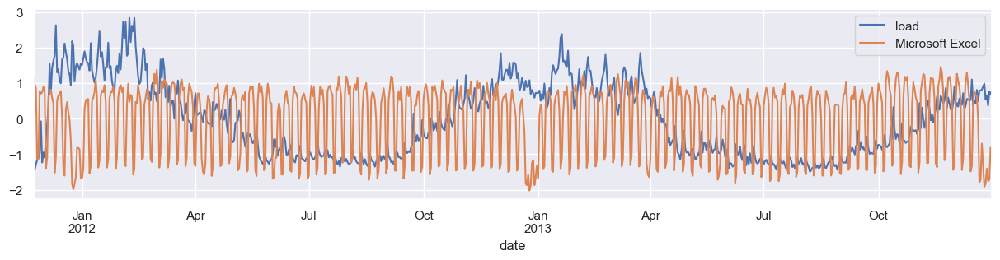

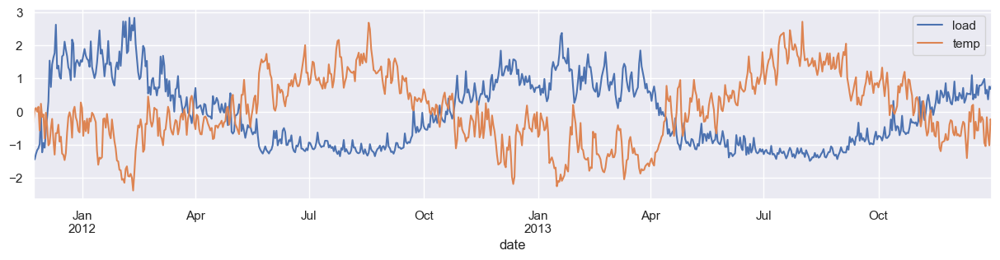

In [23]:
df_plot = df_dataset.resample('D').mean()
df_plot = (df_plot-df_plot.mean())/df_plot.std()
df_plot[['load','Microsoft Excel']].loc[:'2013'].plot(figsize=(15,3))
plt.show()
df_plot[['load','temp']].loc[:'2013'].plot(figsize=(15,3))
plt.show()

In [24]:
list_feat = ['weekday','hour','temp', 'temp_roll24_mean',
             'holiday_Name_encode','holiday_Type_encode',
             'load_shift24', 'load_shift168',
             'Microsoft Excel', 'Education']

Model: LGBM
R SQUARED: 0.951
MAE: 0.0113


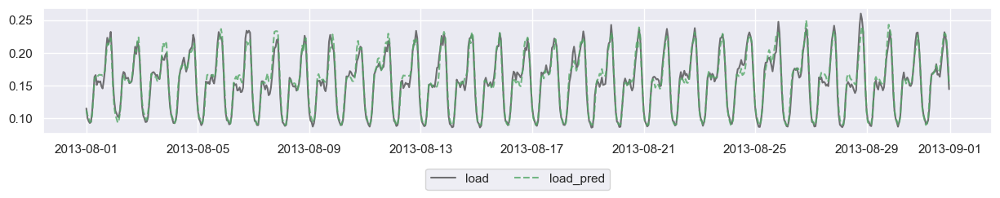

In [25]:
traindata = df_dataset.loc[:'2012'].copy()
testdata = df_dataset.loc['2013':].copy()

LGB_model = lgb.LGBMRegressor()
LGB_model.fit(traindata[list_feat], traindata['load'])
testdata['load_pred'] = LGB_model.predict(testdata[list_feat])
errors = abs(testdata['load_pred'] - testdata['load'])
RSQUARED = r2_score(testdata['load'], testdata['load_pred'])
MAE = mean_absolute_error(testdata['load'], testdata['load_pred'])

print("Model: LGBM")
print("R SQUARED: "+str(round(RSQUARED,4)))
print("MAE: "+str(round(MAE,4)))

plt.figure(figsize=(15,2))
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load'], '-k', alpha=0.6, label='load')
plt.plot(testdata.loc['2013-8'].index, testdata.loc['2013-8','load_pred'], '--g', alpha=0.8, label='load_pred')
plt.legend(loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.5))

In [26]:
testdata[['load','load_pred']].iplot()
(testdata['load_pred'] - testdata['load']).resample('D').mean().iplot(kind='bar')